<a href="https://colab.research.google.com/github/MayerT1/Prep_GEDI/blob/main/GEDI_L1B_Target_fetch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install earthaccess harmony-py hvplot folium geopandas geoviews

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
import os

# Define the base project folder and subdirectories
base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project'
subdirs = [
    'target_data',
    'GEDI_target',
    'data',
    'models',
    'scripts',
    'notebooks',
    'config',
    'results'
]

# Create each subdirectory
for subdir in subdirs:
    path = os.path.join(base_dir, subdir)
    os.makedirs(path, exist_ok=True)
    print(f"Created: {path}")


Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/models
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/scripts
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/notebooks
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/config
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results


In [ ]:
!pwd

/content


In [ ]:
%cd /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project

/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project


Make a new folder to work in and change directory to that location

In [ ]:
# !mkdir Module_2_GEDI_L2b

# !mkdir Module_2_GEDI_L2b/SPB_AOI
# !mkdir Module_2_GEDI_L2b/Prescribed_Burn_AOI
# !mkdir Module_2_GEDI_L2b/Sewanee_Domain
# !mkdir Module_2_GEDI_L2b/PaintRock_AOI

Change directory to that new folder

In [ ]:
# %cd /content/Module_2_GEDI_L2b

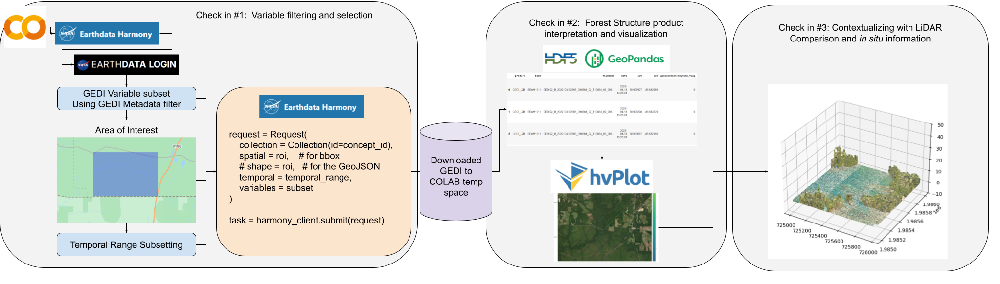

Link to editable workflow (to be removed at the end) https://docs.google.com/drawings/d/1q49Oa-y9W5X25_Qijg0IuSczzcVrcOX5mVfiyIO_UmE/edit

Load the needed packages

In [ ]:

from harmony import BBox, Client, Collection, Request, CapabilitiesRequest
import h5py
from datetime import datetime
import json
import earthaccess
import geopandas as gp
import pandas as pd
import numpy as np
import os
from IPython.display import JSON
from shapely.geometry import Point
import hvplot.pandas
import folium
from folium import GeoJson
from IPython.display import display, HTML
import requests
from io import StringIO
from datetime import datetime
import seaborn as sns
from matplotlib import cm, colors
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable, get_cmap
import textwrap
from mpl_toolkits.mplot3d import Axes3D
# gv.extension('bokeh', 'matplotlib')
from holoviews import opts
import shapely
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as colors

os.chdir('../../')

## Authenticate

Pause here and set up your arorund and have your username and password ready for this next section. See the [EarthData Login](https://urs.earthdata.nasa.gov/) if you dont have an account yet.

`earthaccess.login()` is used here to access NASA Earthdata Login (EDL) credentials stored in a .netrc file and allows users to type their credentials and persist them to a .netrc file if one does not exist.

In [ ]:
auth = earthaccess.login(persist=True)
# auth.token

Enter your Earthdata Login username: tjm0042
Enter your Earthdata password: ··········


To access data through Harmony service, we need to create a Harmony Client object using either your EDL token or your Earthdata Login credentials. Below, `username` and `password` are directly provided to `Client` function. See [here](https://github.com/nasa/harmony-py/blob/main/examples/intro_tutorial.ipynb) for other options you can create Harmony Client object.

In [ ]:
harmony_client = Client(auth=(auth.username, auth.password))

# Visualize our Areas of intres (AOI)

Add relivant biophysical and forest informaiton regarind these sites see  the folder here with the docs to support this: https://drive.google.com/drive/folders/1WvBSUIHy6I05j8s1ZZRarho5qnG2wdnb

In [ ]:
# Bring in aois
geojson_urls = {
    # "SPB_AOI": "https://raw.githubusercontent.com/SERVIR/GEDI_Earthhub_ARSET_Training/main/AOIs/SPB_AOI.geojson",
    # "Prescribed_Burn_AOI": "https://raw.githubusercontent.com/SERVIR/GEDI_Earthhub_ARSET_Training/main/AOIs/prescribed_burn_aoi.geojson",
    "Sewanee_Domain": "https://raw.githubusercontent.com/MayerT1/Prep_GEDI/main/AOI/Sewanee_DL_project_bounds.geojson",
    # "PaintRockAOI": "https://raw.githubusercontent.com/SERVIR/GEDI_Earthhub_ARSET_Training/main/AOIs/PaintRockAOI.geojson"
}

In [ ]:
# Load GeoJSONs into GeoDataFrames and store map HTML
geojson_gdfs = {}
maps_html = []

def create_map_and_gdf(name, url):
    # Get GeoJSON from URL
    geojson_data = requests.get(url).json()

    # Create GeoDataFrame
    gdf = gp.GeoDataFrame.from_features(geojson_data["features"])
    geojson_gdfs[name] = gdf

    # Determine map center
    coords = geojson_data['features'][0]['geometry']['coordinates']
    geom_type = geojson_data['features'][0]['geometry']['type']

    if geom_type == "Polygon":
        coords = coords[0]
    elif geom_type == "MultiPolygon":
        coords = coords[0][0]
    else:
        raise ValueError(f"Unsupported geometry type: {geom_type}")

    lat = sum(pt[1] for pt in coords) / len(coords)
    lon = sum(pt[0] for pt in coords) / len(coords)

    # Create map
    fmap = folium.Map(location=[lat, lon], zoom_start=13, tiles="OpenStreetMap")
    folium.GeoJson(geojson_data, name=name).add_to(fmap)

    # Return rendered HTML
    return fmap._repr_html_()

# Generate maps and GeoDataFrames
for name, url in geojson_urls.items():
    html_map = create_map_and_gdf(name, url)
    maps_html.append(html_map)


In [ ]:
# Display maps side by side
html = f"""
<div style="display: flex; flex-wrap: wrap;">
    {''.join([f'<div style="flex: 1; min-width: 400px; margin: 5px;">{m}</div>' for m in maps_html])}
</div>
"""
display(HTML(html))

In [ ]:
##Pull out the geopanda dataframes
# SPB_AOI = geojson_gdfs["SPB_AOI"]
# Prescribed_Burn_AOI = geojson_gdfs["Prescribed_Burn_AOI"]
Sewanee_Domain = geojson_gdfs["Sewanee_Domain"]
# PaintRock_AOI = geojson_gdfs["PaintRockAOI"]

In [ ]:
# Store all bbox objects in a dictionary for later use
bbox_dict = {}

for name, url in geojson_urls.items():
    gdf = gp.read_file(url)
    minx, miny, maxx, maxy = gdf.total_bounds
    bbox = BBox(minx, miny, maxx, maxy)
    bbox_dict[f"{name}_roi"] = bbox

bbox_dict


{'Sewanee_Domain_roi': BBox: West:-85.98985851794494, South:35.12704695073614, East:-85.85713664512146, North:35.23574346765027}

## Get the GEDI Collections Harmony Capabilities

First lets investigate what capabilites Harmony has to request data. Using hte short name `'GEDI02_B'`
('GEDI02_A', 'GEDI02_B', 'GEDI01_B')

view informaiton such as `conceptId` such as variable subsetting, bounding box subsetting, shapefile subsetting, concatenation and reprojection, etc.

products of intrest: https://docs.google.com/spreadsheets/d/1Uvls3Oxn_jSmTyaSoWadQrS8tZSWyUGYai7etUoALLc/edit?gid=0#gid=0

In [ ]:
capabilities = harmony_client.submit(CapabilitiesRequest(short_name='GEDI01_B'))
print(json.dumps(capabilities, indent=2))

{
  "conceptId": "C2142749196-LPCLOUD",
  "shortName": "GEDI01_B",
  "variableSubset": true,
  "bboxSubset": true,
  "shapeSubset": true,
  "temporalSubset": true,
  "concatenate": false,
  "reproject": false,
  "outputFormats": [
    "application/x-hdf"
  ],
  "services": [
    {
      "name": "sds/trajectory-subsetter",
      "href": "https://cmr.earthdata.nasa.gov/search/concepts/S2836723123-XYZ_PROV",
      "capabilities": {
        "subsetting": {
          "temporal": true,
          "bbox": true,
          "shape": true,
          "variable": true
        },
        "output_formats": [
          "application/x-hdf"
        ]
      }
    }
  ],
  "variables": [
    {
      "name": "/BEAM0000/all_samples_sum",
      "href": "https://cmr.earthdata.nasa.gov/search/concepts/V2809406098-LPCLOUD"
    },
    {
      "name": "/BEAM0000/ancillary/master_time_epoch",
      "href": "https://cmr.earthdata.nasa.gov/search/concepts/V2809406212-LPCLOUD"
    },
    {
      "name": "/BEAM0000/anc

## Create a Harmony Request

There are several parameters that can be used for the Harmony request. See [the documentation](https://harmony-py.readthedocs.io/en/latest/) and [the introductory Harmony tutorial ](https://github.com/nasa/harmony-py/blob/main/examples/intro_tutorial.ipynb) for more details.



Harmony provides access to services that can transform data from NASA's [Earth Observing Systems Data and Information System (EOSDIS)](https://www.earthdata.nasa.gov/eosdis) Distributed Active Archive Centers (DAAC). [`harmony-py`](https://github.com/nasa/harmony-py) Python package is the recommended way of interacting with Harmony service. This notebook shows how to query and access customized [NASA's LP DAAC](https://lpdaac.usgs.gov/)  GEDI data outputs using [NASA's Harmony Services](https://harmony.earthdata.nasa.gov/).


### GEDI Collection Concept ID

`collection` is a Required parameter. The concept ID, which is the NASA EOSDIS collection ID provided in the Common Metadata Repository [(CMR)](https://cmr.earthdata.nasa.gov/search/site/docs/search/api.html) metadata **OR** Product short name (e.g. 'C2142776747-LPCLOUD') can be provided to search for collections.

Below, `concept_id` is saved to a variable.  

In [ ]:
print(capabilities['shortName'], ',', capabilities['conceptId'])

concept_id = capabilities['conceptId']
print("concept_id:", concept_id)

GEDI01_B , C2142749196-LPCLOUD
concept_id: C2142749196-LPCLOUD


### GEDI Variable Subset

Take time to explore GEDI variables of importance via the [GEDI l2b dictionary](https://lpdaac.usgs.gov/documents/980/gedi_l2b_dictionary_P003_v2.html)

In [ ]:
#See the append_field.txt which hasd a long dictionary of the fields and products of GEDI
#This ictionary will be used to subset our variables of intrest
#Notice this includes'GEDI01_B','GEDI02_A', and 'GEDI02_B'

append_url = "https://raw.githubusercontent.com/MayerT1/Prep_GEDI/main/append_field.txt"
append_text = requests.get(append_url).text

start_index = append_text.find("{")
end_index = append_text.rfind("}") + 1
dict_str = append_text[start_index:end_index]

append_dict = eval(dict_str)

In [ ]:
#Display the dictionary we will use to subset later
append_dict

{'GEDI_L1B': ['geolocation/altitude_instrument',
  'geolocation/local_beam_elevation',
  'tx_sample_start_index',
  'nsemean_odd',
  'ancillary/master_time_epoch',
  'noise_stddev_corrected',
  'tx_pulseflag',
  'geolocation/longitude_bin0_error',
  'selection_stretchers_x',
  'nsemean_even',
  'geolocation/latitude_instrument',
  'geolocation/digital_elevation_model',
  'geolocation/longitude_instrument_error',
  'geolocation/longitude_lastbin_error',
  'tx_egsigma',
  'geolocation/neutat_delay_total_bin0',
  'rx_energy',
  'master_frac',
  'rx_sample_count',
  'rxwaveform',
  'tx_gloc',
  'ancillary/mean_samples',
  'geolocation/longitude_instrument',
  'tx_eggamma_error',
  'rx_offset',
  'tx_egbias_error',
  'geolocation/bounce_time_offset_lastbin',
  'all_samples_sum',
  'geophys_corr/tide_load',
  'geolocation/solar_azimuth',
  'geolocation/mean_sea_surface',
  'geolocation/neutat_delay_total_lastbin',
  'th_left_used',
  'rx_sample_start_index',
  'geophys_corr/tide_ocean',
  'g

In [ ]:
# print only the dictionary fo avaible GEDI 2 B products to explore
gedi_l2b = append_dict.get('GEDI_L1B', {})

# Step 4: Print items under 'GEDI_L2B'
print("Items under 'GEDI_L1B':")
for item in gedi_l2b:
    print(item)

Items under 'GEDI_L1B':
geolocation/altitude_instrument
geolocation/local_beam_elevation
tx_sample_start_index
nsemean_odd
ancillary/master_time_epoch
noise_stddev_corrected
tx_pulseflag
geolocation/longitude_bin0_error
selection_stretchers_x
nsemean_even
geolocation/latitude_instrument
geolocation/digital_elevation_model
geolocation/longitude_instrument_error
geolocation/longitude_lastbin_error
tx_egsigma
geolocation/neutat_delay_total_bin0
rx_energy
master_frac
rx_sample_count
rxwaveform
tx_gloc
ancillary/mean_samples
geolocation/longitude_instrument
tx_eggamma_error
rx_offset
tx_egbias_error
geolocation/bounce_time_offset_lastbin
all_samples_sum
geophys_corr/tide_load
geolocation/solar_azimuth
geolocation/mean_sea_surface
geolocation/neutat_delay_total_lastbin
th_left_used
rx_sample_start_index
geophys_corr/tide_ocean
geophys_corr/tide_ocean_pole
tx_eggamma
geophys_corr/tide_pole
tx_sample_count
geolocation/surface_type
geolocation/neutat_delay_derivative_bin0
geolocation/digital_el

Select your variables of intrest

In [ ]:
#Selecting the 'GEDI02_B' of intrest to then be downloaded
#subset_L2B = ['geolocation/lat_lowestmode', 'geolocation/lon_lowestmode', 'geolocation/degrade_flag', 'geolocation/digital_elevation_model','geolocation/elev_lowestmode','geolocation/elev_highestreturn','l2b_quality_flag','rh100','fhd_normal','cover','cover_z','pai','pai_z','pavd_z','rhov','omega','land_cover_data/pft_class']


# #Selecting the 'GEDI02_B' of intrest to then be downloaded
# subset_L2B = ['geolocation/lat_lowestmode', 'geolocation/lon_lowestmode', 'geolocation/degrade_flag', 'geolocation/digital_elevation_model','geolocation/elev_lowestmode','geolocation/elev_highestreturn','l2b_quality_flag','rh100','fhd_normal','pai'] #'cover','cover_z','pai','pai_z','pavd_z','rhov','omega','land_cover_data/pft_class']


# subset_L2B =  ['geolocation/lat_lowestmode','geolocation/lon_lowestmode','geolocation/solar_elevation','geolocation/local_beam_elevation','selected_l2a_algorithm','geolocation/degrade_flag','l2b_quality_flag','geolocation/digital_elevation_model','geolocation/elev_lowestmode','geolocation/elev_highestreturn', 'rh100','num_detectedmodes', 'sensitivity','land_cover_data/leaf_off_flag','/geolocation/solar_elevation','pgap_theta_z', 'pai', 'pai_z', 'fhd_normal', 'pavd_z', 'cover','cover_z','pgap_theta','pgap_theta_error','rhov','rhov_error','rhog', 'rhog_error']



subset_L2B = ['geolocation/latitude_bin0','geolocation/longitude_bin0','shot_number','geolocation/degrade','stale_return_flag','geolocation/elevation_bin0','rxwaveform', 'rx_energy', 'geolocation/solar_elevation', 'geolocation/digital_elevation_model'] #'degrade'

In [ ]:
subset_L2B

['geolocation/latitude_bin0',
 'geolocation/longitude_bin0',
 'shot_number',
 'geolocation/degrade',
 'stale_return_flag',
 'geolocation/elevation_bin0',
 'rxwaveform',
 'rx_energy',
 'geolocation/solar_elevation',
 'geolocation/digital_elevation_model']

In [ ]:
### filter those varibales ofintrest out of the larger list
selected_L2B = []
for s in subset_L2B:
    my_var = [v for v in gedi_l2b if v.endswith(f'{s}')]
    if len(my_var) == 1:
        selected_L2B.append(my_var[0])

    elif len(my_var) > 1:
        my_var = [v for v in my_var if v.startswith(f'{s}')]

        for l in my_var:
            if l not in selected_L2B:
                selected_L2B.append(l)

selected_L2B

['geolocation/latitude_bin0',
 'geolocation/longitude_bin0',
 'shot_number',
 'geolocation/degrade',
 'stale_return_flag',
 'geolocation/elevation_bin0',
 'rxwaveform',
 'rx_energy',
 'geolocation/solar_elevation',
 'geolocation/digital_elevation_model']

Select the subset of your desired beams. For instance, you can only select Full Power beams ('BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011').

In [ ]:
#Selecting a few beams: ['BEAM0000', 'BEAM0001', 'BEAM0010', 'BEAM0011', 'BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']
beams = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']


In [ ]:
#Append our beams of intrest to our variables of intrest
#the subset list will then be used throughout
subset = []
for b in beams:
    beam_subset = [f'/{b}/{layer}' for layer in selected_L2B]
    [subset.append(i) for i in beam_subset]
subset

['/BEAM0101/geolocation/latitude_bin0',
 '/BEAM0101/geolocation/longitude_bin0',
 '/BEAM0101/shot_number',
 '/BEAM0101/geolocation/degrade',
 '/BEAM0101/stale_return_flag',
 '/BEAM0101/geolocation/elevation_bin0',
 '/BEAM0101/rxwaveform',
 '/BEAM0101/rx_energy',
 '/BEAM0101/geolocation/solar_elevation',
 '/BEAM0101/geolocation/digital_elevation_model',
 '/BEAM0110/geolocation/latitude_bin0',
 '/BEAM0110/geolocation/longitude_bin0',
 '/BEAM0110/shot_number',
 '/BEAM0110/geolocation/degrade',
 '/BEAM0110/stale_return_flag',
 '/BEAM0110/geolocation/elevation_bin0',
 '/BEAM0110/rxwaveform',
 '/BEAM0110/rx_energy',
 '/BEAM0110/geolocation/solar_elevation',
 '/BEAM0110/geolocation/digital_elevation_model',
 '/BEAM1000/geolocation/latitude_bin0',
 '/BEAM1000/geolocation/longitude_bin0',
 '/BEAM1000/shot_number',
 '/BEAM1000/geolocation/degrade',
 '/BEAM1000/stale_return_flag',
 '/BEAM1000/geolocation/elevation_bin0',
 '/BEAM1000/rxwaveform',
 '/BEAM1000/rx_energy',
 '/BEAM1000/geolocation/sol

# Create Request Task and download spatially and vairable subseted H5 Files

These code block creates request tasks via harmony and downloads them to the set directories.
The AOI, time period, and subset variables are used to create the the request


In [ ]:
# # Define temporal range
# temporal_range = {'start': datetime(2019, 4, 1),
#                   'stop': datetime(2024, 12, 30)}

In [ ]:
# # Corresponding output directories
# output_dirs = [
#     # '/content/Module_2_GEDI_L2b/SPB_AOI',
#     # '/content/Module_2_GEDI_L2b/Prescribed_Burn_AOI',
#     # '/content/Module_2_GEDI_L2b/PaintRock_AOI',
#     # '/content/Module_2_GEDI_L2b/Sewanee_Domain'
#     '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
# ]

In [ ]:
# # Loop through paired spatial ROIs and directories
# for (spatial, out_dir) in zip(bbox_dict.keys(), output_dirs):
#     print(f"\nSubmitting request for: {out_dir}")

#     request = Request(
#         collection=Collection(id=concept_id),
#         spatial=bbox_dict[spatial],  # Use the corresponding BBox from the dictionary
#         temporal=temporal_range,
#         variables=subset
#     )

#     print("Check if the request payload is valid:", request.is_valid())
#     print(request.__dict__)

#     task = harmony_client.submit(request)
#     print(f'Harmony request ID: {task}')

#     print('Processing your Harmony request:')
#     task_json = harmony_client.result_json(task, show_progress=True)

#     results = harmony_client.download_all(task, directory=out_dir, overwrite=True)
#     file_names = [f.result() for f in results]

#     print(f"Download completed for {out_dir}")


dev loop the harmoy api request

In [ ]:
# Corresponding output directories
output_dirs = [
    '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
]

In [44]:
from datetime import datetime, timedelta
import os
from harmony import BBox, Request, Collection

# --- CONFIG ---
num_chunks = 10
beams = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

# Define temporal range
start_date = datetime(2019, 4, 1)
end_date = datetime(2024, 12, 30)
total_days = (end_date - start_date).days
chunk_size = total_days // num_chunks

# Loop through each AOI and its output directory
for (spatial, out_dir) in zip(bbox_dict.keys(), output_dirs):
    print(f"\n🔹 Starting downloads for AOI: {spatial}")

    # Loop through each beam
    for beam in beams:
        print(f"\n➡️ Beam: {beam}")

        # Filter your subset list for the current beam
        subset_beam = [v for v in subset if f"/{beam}/" in v]

        # Make sure we have output folders for this beam
        beam_out_dir = os.path.join(out_dir, beam)
        os.makedirs(beam_out_dir, exist_ok=True)

        # Split time range into N chunks
        for i in range(num_chunks):
            chunk_start = start_date + timedelta(days=i * chunk_size)
            chunk_end = start_date + timedelta(days=(i + 1) * chunk_size)
            if chunk_end > end_date:
                chunk_end = end_date

            temporal_chunk = {'start': chunk_start, 'stop': chunk_end}

            # Create a subfolder per chunk for better organization
            chunk_folder_name = f"{beam}_chunk_{i+1:02d}_{chunk_start.date()}_{chunk_end.date()}"
            chunk_out_dir = os.path.join(beam_out_dir, chunk_folder_name)
            os.makedirs(chunk_out_dir, exist_ok=True)

            print(f"\n🕒 {beam} | Chunk {i+1}/{num_chunks}: {chunk_start.date()} → {chunk_end.date()}")

            try:
                request = Request(
                    collection=Collection(id=concept_id),
                    spatial=bbox_dict[spatial],
                    temporal=temporal_chunk,
                    variables=subset_beam
                )

                if not request.is_valid():
                    print(f"⚠️ Skipping invalid request for {beam} chunk {i+1}")
                    continue

                print(f"Submitting Harmony request for {beam} chunk {i+1}")
                task = harmony_client.submit(request)

                print("⏳ Waiting for Harmony task to complete...")
                task_json = harmony_client.result_json(task, show_progress=True)

                print(f"⬇️ Downloading results to: {chunk_out_dir}")
                results = harmony_client.download_all(task, directory=chunk_out_dir, overwrite=True)

                file_names = [f.result() for f in results]
                print(f"✅ Download completed for {beam} chunk {i+1}")

            except Exception as e:
                print(f"❌ Error with {beam} chunk {i+1}: {e}")



🔹 Starting downloads for AOI: Sewanee_Domain_roi

➡️ Beam: BEAM0101

🕒 BEAM0101 | Chunk 1/10: 2019-04-01 → 2019-10-28
Submitting Harmony request for BEAM0101 chunk 1
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011505_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011507_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011506_GEDI01_B_2019209043943_O03530_03_T03157_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM0101 chunk 1

🕒 BEAM0101 | Chunk 2/10: 2019-10-28 → 2020-05-25
Submitting Harmony request for BEAM0101 chunk 2
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_02_2019-10-28_2020-05-25
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_02_2019-10-28_2020-05-25/119015652_GEDI01_B_2019337015939_O05514_03_T01887_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_02_2019-10-28_2020-05-25/119015651_GEDI01_B_2019312044317_O05128_02_T02571_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM0101 chunk 2

🕒 BEAM0101 | Chunk 3/10: 2020-05-25 → 2020-12-21
Submitting Harmony request for BEAM0101 chunk 3
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_03_2020-05-25_2020-12-21
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_03_2020-05-25_2020-12-21/119015815_GEDI01_B_2020196021509_O08987_02_T05264_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_03_2020-05-25_2020-12-21/119015814_GEDI01_B_2020182144232_O08778_03_T00311_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM0101 chunk 3

🕒 BEAM0101 | Chunk 4/10: 2020-12-21 → 2021-07-19
Submitting Harmony request for BEAM0101 chunk 4
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_04_2020-12-21_2021-07-19
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_04_2020-12-21_2021-07-19/119016153_GEDI01_B_2021135083748_O13719_03_T08849_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_04_2020-12-21_2021-07-19/119016154_GEDI01_B_2021139070445_O13780_03_T06003_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_04_2020-12-21_2021-07-19/119016152_GEDI01_B_2021131101046_O13658_03_T04580_02_005_02_V002_subsetted.h5
✅ Download completed for BEAM0101 chunk 4

🕒 BEAM0101 | Chunk 5/10: 2021-07-19 → 2022-02-14
Submitting Harmony request for BEAM0101 chunk 5
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_05_2021-07-19_2022-02-14
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_05_2021-07-19_2022-02-14/119016382_GEDI01_B_2021232110553_O15224_02_T11109_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_05_2021-07-19_2022-02-14/119016386_GEDI01_B_2022016072349_O17531_03_T07426_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_05_2021-07-19_2022-02-14/119016384_GEDI01_B_2021288125533_O16093_02_T09533_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_05_2021-07-19_2022-02-14/119016385_GEDI01_B_2021298160332_O16250_03_T10425_02_005_02_V002_subsetted.h5
/content/drive/MyDriv

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_06_2022-02-14_2022-09-12
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_06_2022-02-14_2022-09-12/119018130_GEDI01_B_2022110105831_O18991_02_T02571_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_06_2022-02-14_2022-09-12/119018132_GEDI01_B_2022177153027_O20033_03_T01887_02_005_03_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_06_2022-02-14_2022-09-12/119018128_GEDI01_B_2022062130418_O18248_03_T10425_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_06_2022-02-14_2022-09-12/119018131_GEDI01_B_2022139064237_O19438_03_T04580_02_005_02_V002_subsetted.h5
/content/drive/MyDriv

 [ Processing:  23% ] |###########                                        | [/]


❌ Error with BEAM0101 chunk 7: 500 Server Error: Internal Server Error for url: https://harmony.earthdata.nasa.gov/oauth2/redirect?code=vSdi4eeOri5jvSDv3DtQtTQ_fmwUpDyQIZ-QCtp0v6UmE2HPckCxYk9_N_e9FdJDsk7cli6ARVvxntT_Q_TYz81fYkHUiWPw&state=16a13a9e65dfc9f56ad0a5018ee01294

🕒 BEAM0101 | Chunk 8/10: 2023-04-10 → 2023-11-06
Submitting Harmony request for BEAM0101 chunk 8
❌ Error with BEAM0101 chunk 8: ('Bad Request', 'Error: No matching granules found.')

🕒 BEAM0101 | Chunk 9/10: 2023-11-06 → 2024-06-03
Submitting Harmony request for BEAM0101 chunk 9
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_09_2023-11-06_2024-06-03
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_09_2023-11-06_2024-06-03/119020527_GEDI01_B_2024150175955_O30938_02_T05264_02_006_02_V002_subsetted.h5
✅ Download completed for BEAM0101 chunk 9

🕒 BEAM0101 | Chunk 10/10: 2024-06-03 → 2024-12-30
Submitting Harmony request for BEAM0101 chunk 10
⏳ Waiting for Harmony task to complete...


 [ Processing:  31% ] |###############                                    | [|]


❌ Error with BEAM0101 chunk 10: 500 Server Error: Internal Server Error for url: https://harmony.earthdata.nasa.gov/oauth2/redirect?code=Vbi6xYpm72o7UGd_gg7xZ2jraEdVAdjs86OF4jtNBLhwY0bEMWXN6xnqXPZkCp8x8D6iyRGoPSFUeQjFTiYMzyOnwXITFQz9&state=263852c0f42f81d43a6645455b69f0d6

➡️ Beam: BEAM0110

🕒 BEAM0110 | Chunk 1/10: 2019-04-01 → 2019-10-28
Submitting Harmony request for BEAM0110 chunk 1
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_01_2019-04-01_2019-10-28
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_01_2019-04-01_2019-10-28/119021751_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_01_2019-04-01_2019-10-28/119021753_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_01_2019-04-01_2019-10-28/119021752_GEDI01_B_2019209043943_O03530_03_T03157_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM0110 chunk 1

🕒 BEAM0110 | Chunk 2/10: 2019-10-28 → 2020-05-25
Submitting Harmony request for BEAM0110 chunk 2
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_02_2019-10-28_2020-05-25
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_02_2019-10-28_2020-05-25/119022196_GEDI01_B_2019312044317_O05128_02_T02571_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_02_2019-10-28_2020-05-25/119022197_GEDI01_B_2019337015939_O05514_03_T01887_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM0110 chunk 2

🕒 BEAM0110 | Chunk 3/10: 2020-05-25 → 2020-12-21
Submitting Harmony request for BEAM0110 chunk 3
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_03_2020-05-25_2020-12-21
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_03_2020-05-25_2020-12-21/119022385_GEDI01_B_2020196021509_O08987_02_T05264_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_03_2020-05-25_2020-12-21/119022384_GEDI01_B_2020182144232_O08778_03_T00311_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM0110 chunk 3

🕒 BEAM0110 | Chunk 4/10: 2020-12-21 → 2021-07-19
Submitting Harmony request for BEAM0110 chunk 4
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_04_2020-12-21_2021-07-19
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_04_2020-12-21_2021-07-19/119022688_GEDI01_B_2021131101046_O13658_03_T04580_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_04_2020-12-21_2021-07-19/119022689_GEDI01_B_2021135083748_O13719_03_T08849_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_04_2020-12-21_2021-07-19/119022690_GEDI01_B_2021139070445_O13780_03_T06003_02_005_02_V002_subsetted.h5
✅ Download completed for BEAM0110 chunk 4

🕒 BEAM0110 | Chunk 5/10: 2021-07-19 → 2022-02-14
Submitting Harmony request for BEAM0110 chunk 5
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_05_2021-07-19_2022-02-14
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_05_2021-07-19_2022-02-14/119023475_GEDI01_B_2021298160332_O16250_03_T10425_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_05_2021-07-19_2022-02-14/119023472_GEDI01_B_2021232110553_O15224_02_T11109_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_05_2021-07-19_2022-02-14/119023474_GEDI01_B_2021288125533_O16093_02_T09533_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_05_2021-07-19_2022-02-14/119023476_GEDI01_B_2022016072349_O17531_03_T07426_02_005_02_V002_subsetted.h5
/content/drive/MyDriv

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_06_2022-02-14_2022-09-12
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_06_2022-02-14_2022-09-12/119023704_GEDI01_B_2022110105831_O18991_02_T02571_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_06_2022-02-14_2022-09-12/119023702_GEDI01_B_2022062130418_O18248_03_T10425_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_06_2022-02-14_2022-09-12/119023705_GEDI01_B_2022139064237_O19438_03_T04580_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_06_2022-02-14_2022-09-12/119023703_GEDI01_B_2022068034341_O18335_02_T00995_02_005_02_V002_subsetted.h5
/content/drive/MyDriv

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_07_2022-09-12_2023-04-10
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_07_2022-09-12_2023-04-10/119024922_GEDI01_B_2022289120454_O21768_02_T09533_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_07_2022-09-12_2023-04-10/119024924_GEDI01_B_2022352181058_O22749_03_T07426_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_07_2022-09-12_2023-04-10/119024925_GEDI01_B_2022358084911_O22836_02_T06687_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_07_2022-09-12_2023-04-10/119024926_GEDI01_B_2023023204458_O23309_02_T08110_02_005_02_V002_subsetted.h5
✅ Download completed 

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_09_2023-11-06_2024-06-03
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_09_2023-11-06_2024-06-03/119026790_GEDI01_B_2024150175955_O30938_02_T05264_02_006_02_V002_subsetted.h5
✅ Download completed for BEAM0110 chunk 9

🕒 BEAM0110 | Chunk 10/10: 2024-06-03 → 2024-12-30
Submitting Harmony request for BEAM0110 chunk 10
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_10_2024-06-03_2024-12-30
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_10_2024-06-03_2024-12-30/119026978_GEDI01_B_2024169103448_O31228_02_T05264_02_006_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_10_2024-06-03_2024-12-30/119026979_GEDI01_B_2024206031011_O31797_03_T04733_02_006_03_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0110/BEAM0110_chunk_10_2024-06-03_2024-12-30/119026980_GEDI01_B_2024294160731_O33170_03_T08849_02_006_02_V002_subsetted.h5
✅ Download completed for BEAM0110 chunk 10

➡️ Beam: BEAM1000

🕒 BEAM1000 | Chunk 1/10: 2019-04-01 → 2019-10-28
Submitting Harmony request for BEAM1000 chunk 1
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_01_2019-04-01_2019-10-28
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_01_2019-04-01_2019-10-28/119027364_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_01_2019-04-01_2019-10-28/119027363_GEDI01_B_2019122150008_O02186_03_T04733_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_01_2019-04-01_2019-10-28/119027365_GEDI01_B_2019209043943_O03530_03_T03157_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_01_2019-04-01_2019-10-28/119027366_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5
✅ Download completed 

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_02_2019-10-28_2020-05-25
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_02_2019-10-28_2020-05-25/119027751_GEDI01_B_2019312044317_O05128_02_T02571_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_02_2019-10-28_2020-05-25/119027752_GEDI01_B_2019337015939_O05514_03_T01887_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM1000 chunk 2

🕒 BEAM1000 | Chunk 3/10: 2020-05-25 → 2020-12-21
Submitting Harmony request for BEAM1000 chunk 3
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_03_2020-05-25_2020-12-21
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_03_2020-05-25_2020-12-21/119027979_GEDI01_B_2020196021509_O08987_02_T05264_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_03_2020-05-25_2020-12-21/119027978_GEDI01_B_2020182144232_O08778_03_T00311_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM1000 chunk 3

🕒 BEAM1000 | Chunk 4/10: 2020-12-21 → 2021-07-19
Submitting Harmony request for BEAM1000 chunk 4
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_04_2020-12-21_2021-07-19
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_04_2020-12-21_2021-07-19/119028258_GEDI01_B_2021135083748_O13719_03_T08849_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_04_2020-12-21_2021-07-19/119028259_GEDI01_B_2021139070445_O13780_03_T06003_02_005_02_V002_subsetted.h5
✅ Download completed for BEAM1000 chunk 4

🕒 BEAM1000 | Chunk 5/10: 2021-07-19 → 2022-02-14
Submitting Harmony request for BEAM1000 chunk 5
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_05_2021-07-19_2022-02-14
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_05_2021-07-19_2022-02-14/119028459_GEDI01_B_2021232110553_O15224_02_T11109_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_05_2021-07-19_2022-02-14/119028464_GEDI01_B_2022025202812_O17679_02_T08110_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_05_2021-07-19_2022-02-14/119028461_GEDI01_B_2021288125533_O16093_02_T09533_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_05_2021-07-19_2022-02-14/119028462_GEDI01_B_2021298160332_O16250_03_T10425_02_005_02_V002_subsetted.h5
/content/drive/MyDriv

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_06_2022-02-14_2022-09-12
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_06_2022-02-14_2022-09-12/119028768_GEDI01_B_2022062130418_O18248_03_T10425_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_06_2022-02-14_2022-09-12/119028769_GEDI01_B_2022068034341_O18335_02_T00995_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_06_2022-02-14_2022-09-12/119028770_GEDI01_B_2022110105831_O18991_02_T02571_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_06_2022-02-14_2022-09-12/119028772_GEDI01_B_2022177153027_O20033_03_T01887_02_005_03_V002_subsetted.h5
✅ Download completed 

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10/119030377_GEDI01_B_2022289120454_O21768_02_T09533_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10/119030380_GEDI01_B_2022358084911_O22836_02_T06687_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10/119030379_GEDI01_B_2022352181058_O22749_03_T07426_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10/119030381_GEDI01_B_2023023204458_O23309_02_T08110_02_005_02_V002_subsetted.h5
✅ Download completed 

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_09_2023-11-06_2024-06-03



There is no file to download.

Job status is successful with message: WorkItem warned: sds/trajectory-subsetter:0.3.8: No data found to process.


✅ Download completed for BEAM1000 chunk 9

🕒 BEAM1000 | Chunk 10/10: 2024-06-03 → 2024-12-30
Submitting Harmony request for BEAM1000 chunk 10
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30/119030793_GEDI01_B_2024169103448_O31228_02_T05264_02_006_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30/119030794_GEDI01_B_2024206031011_O31797_03_T04733_02_006_03_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30/119030795_GEDI01_B_2024294160731_O33170_03_T08849_02_006_02_V002_subsetted.h5
✅ Download completed for BEAM1000 chunk 10

➡️ Beam: BEAM1011

🕒 BEAM1011 | Chunk 1/10: 2019-04-01 → 2019-10-28
Submitting Harmony request for BEAM1011 chunk 1
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28/119031125_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28/119031124_GEDI01_B_2019122150008_O02186_03_T04733_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28/119031126_GEDI01_B_2019209043943_O03530_03_T03157_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28/119031127_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5
✅ Download completed 

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_02_2019-10-28_2020-05-25
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_02_2019-10-28_2020-05-25/119031458_GEDI01_B_2019337015939_O05514_03_T01887_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM1011 chunk 2

🕒 BEAM1011 | Chunk 3/10: 2020-05-25 → 2020-12-21
Submitting Harmony request for BEAM1011 chunk 3
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_03_2020-05-25_2020-12-21
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_03_2020-05-25_2020-12-21/119031583_GEDI01_B_2020196021509_O08987_02_T05264_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_03_2020-05-25_2020-12-21/119031582_GEDI01_B_2020182144232_O08778_03_T00311_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM1011 chunk 3

🕒 BEAM1011 | Chunk 4/10: 2020-12-21 → 2021-07-19
Submitting Harmony request for BEAM1011 chunk 4
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_04_2020-12-21_2021-07-19
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_04_2020-12-21_2021-07-19/119031762_GEDI01_B_2021135083748_O13719_03_T08849_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_04_2020-12-21_2021-07-19/119031763_GEDI01_B_2021139070445_O13780_03_T06003_02_005_02_V002_subsetted.h5
✅ Download completed for BEAM1011 chunk 4

🕒 BEAM1011 | Chunk 5/10: 2021-07-19 → 2022-02-14
Submitting Harmony request for BEAM1011 chunk 5
⏳ Waiting for Harmony task to complete...


 [ Processing:  69% ] |###################################                | [\]


❌ Error with BEAM1011 chunk 5: 500 Server Error: Internal Server Error for url: https://harmony.earthdata.nasa.gov/oauth2/redirect?code=RLu-u0mqIpV3GzWwXEaq2Xa9WB9-yCxr5gVBYY3HTY_amVAaNbXsMbBNhtBooZZ6rkHeNLKiTpss2djSd7G-gyK72g25xLhp&state=86a219a2d53d9066cb7aeed97481a0a8

🕒 BEAM1011 | Chunk 6/10: 2022-02-14 → 2022-09-12
Submitting Harmony request for BEAM1011 chunk 6
❌ Error with BEAM1011 chunk 6: 500 Server Error: Internal Server Error for url: https://harmony.earthdata.nasa.gov/oauth2/redirect?code=rDIiL9jlZUFJk7oIL4HC7srclc0CJ7D8C3Zrk-Oj8YiOdWpTfJCiCAVjYiE9rfp5kkY6GwlDoKA6gksUHdg2tNboPjz72hz3&state=2c1693d163c9dab7650c57cd8a986e57

🕒 BEAM1011 | Chunk 7/10: 2022-09-12 → 2023-04-10
Submitting Harmony request for BEAM1011 chunk 7
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10/119032503_GEDI01_B_2022289120454_O21768_02_T09533_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10/119032506_GEDI01_B_2022358084911_O22836_02_T06687_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10/119032505_GEDI01_B_2022352181058_O22749_03_T07426_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10/119032507_GEDI01_B_2023023204458_O23309_02_T08110_02_005_02_V002_subsetted.h5
✅ Download completed 

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_09_2023-11-06_2024-06-03



There is no file to download.

Job status is successful with message: WorkItem warned: sds/trajectory-subsetter:0.3.8: No data found to process.


✅ Download completed for BEAM1011 chunk 9

🕒 BEAM1011 | Chunk 10/10: 2024-06-03 → 2024-12-30
Submitting Harmony request for BEAM1011 chunk 10
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_10_2024-06-03_2024-12-30
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_10_2024-06-03_2024-12-30/119032931_GEDI01_B_2024169103448_O31228_02_T05264_02_006_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_10_2024-06-03_2024-12-30/119032932_GEDI01_B_2024206031011_O31797_03_T04733_02_006_03_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_10_2024-06-03_2024-12-30/119032933_GEDI01_B_2024294160731_O33170_03_T08849_02_006_02_V002_subsetted.h5
✅ Download completed for BEAM1011 chunk 10


In [45]:
## confirm files are in the right spots
!find /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target

/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/118361193_GEDI02_B_2019138014405_O02426_02_T03841_02_003_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/118361194_GEDI02_B_2019209043943_O03530_03_T03157_02_003_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/118361195_GEDI02_B_2019210205202_O03556_02_T00995_02_003_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101

filter list: https://docs.google.com/document/d/1nm0qn_E6_dGM2g5_mu4utRip6VzC0QUF3Z_lmtxP4Ow/edit?tab=t.0

look at one h5 to see th evairbale dtype

In [69]:
import h5py

# Path to a single GEDI L1B file
h5_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011505_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5'

with h5py.File(h5_file, 'r') as f:
    print(f"Contents of {h5_file}:\n")
    for beam in f.keys():
        print(f"Beam: {beam}")
        for group_name, group in f[beam].items():
            print(f"  {group_name}:")
            if isinstance(group, h5py.Dataset):
                print(f"    Dataset: shape={group.shape}, dtype={group.dtype}")
            elif isinstance(group, h5py.Group):
                for ds_name, ds in group.items():
                    print(f"    {ds_name}: shape={ds.shape}, dtype={ds.dtype}")
        print("\n")


Contents of /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011505_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5:

Beam: BEAM0101
  delta_time:
    Dataset: shape=(247,), dtype=float64
  geolocation:
    degrade: shape=(247,), dtype=int8
    delta_time: shape=(247,), dtype=float64
    digital_elevation_model: shape=(247,), dtype=float32
    elevation_bin0: shape=(247,), dtype=float64
    latitude_bin0: shape=(247,), dtype=float64
    longitude_bin0: shape=(247,), dtype=float64
    solar_elevation: shape=(247,), dtype=float32
  rx_energy:
    Dataset: shape=(247,), dtype=float64
  rx_sample_count:
    Dataset: shape=(247,), dtype=uint16
  rx_sample_start_index:
    Dataset: shape=(247,), dtype=uint64
  rxwaveform:
    Dataset: shape=(350740,), dtype=float32
  shot_number:
    Dataset: shape=(247,), dtype=uint64
  stale_return_flag:
    Dataset: shape=(247,), dtype=uint8


Beam: METAD

In [ ]:
# import h5py
# import os
# import glob
# import pandas as pd
# import numpy as np
# from geopy.distance import geodesic

# # =========================================
# # CONFIG
# # =========================================
# data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
# output_dir = os.path.join(data_dir, 'filtered_csvs')
# os.makedirs(output_dir, exist_ok=True)

# beam_groups = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

# # variables = [
# #     'geolocation/lat_lowestmode', 'geolocation/lon_lowestmode', 'geolocation/solar_elevation',
# #     'geolocation/local_beam_elevation', 'selected_l2a_algorithm', 'geolocation/degrade_flag',
# #     'l2a_quality_flag', 'l2b_quality_flag', 'geolocation/digital_elevation_model',
# #     'geolocation/elev_lowestmode', 'geolocation/elev_highestreturn', 'rh100', 'num_detectedmodes',
# #     'sensitivity', 'land_cover_data/leaf_off_flag', 'pgap_theta_z', 'pai', 'pai_z', 'fhd_normal',
# #     'pavd_z', 'cover', 'cover_z', 'pgap_theta', 'pgap_theta_error', 'rhov', 'rhov_error',
# #     'rhog', 'rhog_error'
# # ]


# variables = [
#       'geolocation/latitude_bin0','geolocation/longitude_bin0','shot_number','geolocation/degrade','stale_return_flag',
#       'geolocation/elevation_bin0','rxwaveform', 'rx_energy', 'geolocation/solar_elevation', 'geolocation/digital_elevation_model'
# ]

# resample_distance = 25

# # =========================================
# # FUNCTIONS
# # =========================================
# def resample_25m(df):
#     if df.empty:
#         return df
#     selected_rows = [df.iloc[0]]
#     last_coord = (df.iloc[0]['lat'], df.iloc[0]['lon'])

#     for _, row in df.iterrows():
#         current_coord = (row['lat'], row['lon'])
#         dist = geodesic(last_coord, current_coord).meters
#         if dist >= resample_distance:
#             selected_rows.append(row)
#             last_coord = current_coord

#     return pd.DataFrame(selected_rows)


# def apply_complex_filters_with_logs(df, beam):
#     logs = {}
#     total = len(df)
#     logs['initial'] = total

#     df.replace(-9999, np.nan, inplace=True)

#     # Core quality filters
#     df_qc = df[
#         (df.get('l2a_quality_flag', 1) == 1) &
#         (df.get('l2b_quality_flag', 1) == 1) &
#         (df.get('degrade_flag', 0) == 0)
#     ]
#     logs['after_qc'] = len(df_qc)

#     # Solar elevation
#     if 'solar_elevation' in df_qc.columns:
#         df_solar = df_qc[df_qc['solar_elevation'] < 0]
#     else:
#         df_solar = df_qc
#     logs['after_solar'] = len(df_solar)

#     # Phenology / leaf-on
#     if 'leaf_off_flag' in df_solar.columns:
#         df_leaf = df_solar[df_solar['leaf_off_flag'] == 0]
#     else:
#         df_leaf = df_solar
#     logs['after_leaf_on'] = len(df_leaf)

#     # Signal penetration
#     if 'sensitivity' in df_leaf.columns:
#         df_sens = df_leaf[df_leaf['sensitivity'] >= 0.95]
#     else:
#         df_sens = df_leaf
#     logs['after_sensitivity'] = len(df_sens)

#     # Topography filter
#     if all(col in df_sens.columns for col in ['digital_elevation_model', 'elev_lowestmode']):
#         df_sens['dem_diff'] = df_sens['elev_lowestmode'] - df_sens['digital_elevation_model']
#         df_topo = df_sens[df_sens['dem_diff'].between(-20, 20)]
#     else:
#         df_topo = df_sens
#     logs['after_topography'] = len(df_topo)

#     # Elevation sanity
#     if all(col in df_topo.columns for col in ['elev_highestreturn', 'elev_lowestmode']):
#         df_elev = df_topo[(df_topo['elev_highestreturn'] - df_topo['elev_lowestmode']).between(0, 100)]
#     else:
#         df_elev = df_topo
#     logs['after_elevation'] = len(df_elev)

#     # Final cleaning
#     if 'num_detectedmodes' in df_elev.columns:
#         df_final = df_elev[df_elev['num_detectedmodes'] > 0]
#     else:
#         df_final = df_elev
#     logs['after_num_detectedmodes'] = len(df_final)

#     return df_final, logs


# # =========================================
# # MAIN LOOP
# # =========================================
# h5_files = [os.path.join(root, file)
#             for root, _, files in os.walk(data_dir)
#             for file in files if file.endswith('.h5')]

# print(f"Found {len(h5_files)} GEDI files to process.\n")

# for h5_file in h5_files:
#     print(f"Processing {h5_file}")
#     with h5py.File(h5_file, 'r') as f:
#         for beam in beam_groups:
#             if beam not in f:
#                 continue

#             beam_data = {}
#             for var in variables:
#                 try:
#                     data = f[beam][var][:]
#                     if data.ndim > 1:
#                         data = data.mean(axis=1)
#                     beam_data[var.split('/')[-1]] = data
#                 except KeyError:
#                     continue

#             if 'lat_lowestmode' not in beam_data or 'lon_lowestmode' not in beam_data:
#                 print(f"⚠️ Skipping {beam} — missing coordinates.")
#                 continue

#             main_len = len(beam_data['lat_lowestmode'])
#             beam_data_filtered = {k: v for k, v in beam_data.items() if len(v) == main_len}

#             df = pd.DataFrame(beam_data_filtered)
#             df.rename(columns={'lat_lowestmode': 'lat', 'lon_lowestmode': 'lon'}, inplace=True)

#             df_filtered, filter_logs = apply_complex_filters_with_logs(df, beam)

#             # Log shot counts per filter
#             print(f"Beam {beam} filter counts: {filter_logs}")

#             df_resampled = resample_25m(df_filtered)

#             if not df_resampled.empty:
#                 base_name = os.path.splitext(os.path.basename(h5_file))[0]
#                 out_path = os.path.join(output_dir, f"{base_name}_{beam}_filtered.csv")
#                 df_resampled.to_csv(out_path, index=False)
#                 print(f"✅ Saved: {out_path} ({len(df_resampled)} shots)\n")
#             else:
#                 print(f"⚠️ No valid data left for {beam} in {os.path.basename(h5_file)}.\n")


In [70]:
# import h5py
# import os
# import glob
# import pandas as pd
# import numpy as np
# from geopy.distance import geodesic

# # =========================================
# # CONFIG
# # =========================================
# data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
# output_dir = os.path.join(data_dir, 'filtered_csvs')
# os.makedirs(output_dir, exist_ok=True)

# beam_groups = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

# variables = [
#     'geolocation/latitude_bin0',
#     'geolocation/longitude_bin0',
#     'shot_number',
#     'geolocation/degrade',
#     'stale_return_flag',
#     'geolocation/elevation_bin0',
#     'rx_waveform',       # keep as 2D array
#     'rx_energy',         # keep as 2D array
#     'geolocation/solar_elevation',
#     'geolocation/digital_elevation_model'
# ]

# resample_distance = 25  # meters

# # =========================================
# # FUNCTIONS
# # =========================================
# def resample_25m(df):
#     if df.empty:
#         return df
#     selected_rows = [df.iloc[0]]
#     last_coord = (df.iloc[0]['lat'], df.iloc[0]['lon'])
#     for _, row in df.iterrows():
#         current_coord = (row['lat'], row['lon'])
#         dist = geodesic(last_coord, current_coord).meters
#         if dist >= resample_distance:
#             selected_rows.append(row)
#             last_coord = current_coord
#     return pd.DataFrame(selected_rows)

# def apply_filters_l1b(df):
#     logs = {}
#     logs['initial'] = len(df)

#     df.replace(-9999, np.nan, inplace=True)

#     # Degrade and stale return filtering
#     df_filtered = df[
#         (df.get('degrade', 0) == 0) &
#         (df.get('stale_return_flag', 0) == 0)
#     ]
#     logs['after_degrade_stale'] = len(df_filtered)

#     # Solar elevation filtering
#     if 'geolocation/solar_elevation' in df_filtered.columns:
#         df_filtered = df_filtered[df_filtered['geolocation/solar_elevation'] >= 0]
#     logs['after_solar'] = len(df_filtered)

#     return df_filtered, logs

# # =========================================
# # MAIN LOOP
# # =========================================
# # Find all L1B files
# h5_files = [f for f in glob.glob(f"{data_dir}/**/*.h5", recursive=True)
#             if 'GEDI01_B' in f]

# print(f"Found {len(h5_files)} GEDI L1B files to process.\n")

# for h5_file in h5_files:
#     print(f"Processing {h5_file}")
#     with h5py.File(h5_file, 'r') as f:
#         for beam in beam_groups:
#             if beam not in f:
#                 continue

#             beam_data = {}
#             for var in variables:
#                 try:
#                     data = f[beam][var][:]
#                     # Store 2D arrays as lists
#                     if data.ndim > 1:
#                         data = [row.tolist() for row in data]
#                     beam_data[var.split('/')[-1]] = data
#                 except KeyError:
#                     continue

#             if 'latitude_bin0' not in beam_data or 'longitude_bin0' not in beam_data:
#                 print(f"⚠️ Skipping {beam} — missing coordinates.")
#                 continue

#             # Ensure consistent length
#             main_len = len(beam_data['latitude_bin0'])
#             beam_data_filtered = {k: v for k, v in beam_data.items() if len(v) == main_len}

#             # Convert to DataFrame
#             df = pd.DataFrame(beam_data_filtered)
#             df.rename(columns={'latitude_bin0': 'lat', 'longitude_bin0': 'lon'}, inplace=True)

#             # Apply L1B filters
#             df_filtered, filter_logs = apply_filters_l1b(df)
#             print(f"Beam {beam} filter counts: {filter_logs}")

#             # Spatial resampling
#             df_resampled = resample_25m(df_filtered)

#             if not df_resampled.empty:
#                 base_name = os.path.splitext(os.path.basename(h5_file))[0]
#                 beam_out_dir = os.path.join(output_dir, beam)
#                 os.makedirs(beam_out_dir, exist_ok=True)
#                 out_csv = os.path.join(beam_out_dir, f"{base_name}_{beam}_filtered.csv")

#                 # ✅ Keep 2D arrays as lists in the columns
#                 df_resampled.to_csv(out_csv, index=False)
#                 print(f"✅ Saved: {out_csv} ({len(df_resampled)} shots)\n")
#             else:
#                 print(f"⚠️ No valid data left for {beam} in {os.path.basename(h5_file)}.\n")


Found 91 GEDI L1B files to process.

Processing /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011505_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5
Beam BEAM0101 filter counts: {'initial': 247, 'after_degrade_stale': 0, 'after_solar': 0}
⚠️ No valid data left for BEAM0101 in 119011505_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5.

Processing /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011507_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5
Beam BEAM0101 filter counts: {'initial': 279, 'after_degrade_stale': 0, 'after_solar': 0}
⚠️ No valid data left for BEAM0101 in 119011507_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5.

Processing /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk

In [78]:
import h5py
import os
import glob
import pandas as pd
import numpy as np
from geopy.distance import geodesic

# =========================================
# CONFIG
# =========================================
data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
output_dir = os.path.join(data_dir, 'filtered_csvs')
os.makedirs(output_dir, exist_ok=True)

beam_groups = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

variables = [
    'geolocation/latitude_bin0',
    'geolocation/longitude_bin0',
    'shot_number',
    'geolocation/degrade',
    'stale_return_flag',
    'geolocation/elevation_bin0',
    'rxwaveform',       # preserve full 2D array
    'rx_energy',        # preserve full 2D array
    'geolocation/solar_elevation',
    'geolocation/digital_elevation_model'
]

resample_distance = 25  # meters

# =========================================
# FUNCTIONS
# =========================================
def resample_25m(df):
    if df.empty:
        return df
    selected_rows = [df.iloc[0]]
    last_coord = (df.iloc[0]['lat'], df.iloc[0]['lon'])
    for _, row in df.iterrows():
        current_coord = (row['lat'], row['lon'])
        dist = geodesic(last_coord, current_coord).meters
        if dist >= resample_distance:
            selected_rows.append(row)
            last_coord = current_coord
    return pd.DataFrame(selected_rows)

def apply_filters_l1b(df):
    logs = {}
    logs['initial'] = len(df)

    df.replace(-9999, np.nan, inplace=True)

    # Degrade and stale return filtering
    df_filtered = df[
        (df.get('geolocation/degrade', 0) == 0) &
        (df.get('stale_return_flag', 0) == 0)
    ]
    logs['after_degrade_stale'] = len(df_filtered)

    # Solar elevation filtering
    if 'geolocation/solar_elevation' in df_filtered.columns:
        df_filtered = df_filtered[df_filtered['geolocation/solar_elevation'] >= 0]
    logs['after_solar'] = len(df_filtered)

    return df_filtered, logs

# =========================================
# MAIN LOOP
# =========================================
# Find all L1B files (only)
h5_files = [f for f in glob.glob(f"{data_dir}/**/*.h5", recursive=True)
            if 'GEDI01_B' in f]

print(f"Found {len(h5_files)} GEDI L1B files to process.\n")

for h5_file in h5_files:
    print(f"Processing {h5_file}")
    with h5py.File(h5_file, 'r') as f:
        for beam in beam_groups:
            if beam not in f:
                continue

            beam_data = {}
            for var in variables:
                try:
                    data = f[beam][var][:]
                    beam_data[var.split('/')[-1]] = data
                except KeyError:
                    continue

            if 'latitude_bin0' not in beam_data or 'longitude_bin0' not in beam_data:
                print(f"⚠️ Skipping {beam} — missing coordinates.")
                continue

            # Ensure consistent length
            main_len = len(beam_data['latitude_bin0'])
            beam_data_filtered = {k: v for k, v in beam_data.items() if len(v) == main_len}

            # Convert to DataFrame
            df = pd.DataFrame({k: v for k, v in beam_data_filtered.items()
                               if k not in ['rxwaveform', 'rx_energy']})
            df.rename(columns={'latitude_bin0': 'lat', 'longitude_bin0': 'lon'}, inplace=True)

            # Apply L1B filters
            df_filtered, filter_logs = apply_filters_l1b(df)
            print(f"Beam {beam} filter counts: {filter_logs}")

            # Spatial resampling
            df_resampled = resample_25m(df_filtered)

            if not df_resampled.empty:
                base_name = os.path.splitext(os.path.basename(h5_file))[0]
                beam_out_dir = os.path.join(output_dir, beam)
                os.makedirs(beam_out_dir, exist_ok=True)
                out_csv = os.path.join(beam_out_dir, f"{base_name}_{beam}_filtered.csv")

                # Save 2D arrays as separate .npy files
                rxwaveforms = beam_data_filtered.get('rxwaveform', [None]*len(df_resampled))
                rxenergy = beam_data_filtered.get('rx_energy', [None]*len(df_resampled))

                out_waveform = os.path.join(beam_out_dir, f"{base_name}_{beam}_rxwaveform.npy")
                out_rxenergy = os.path.join(beam_out_dir, f"{base_name}_{beam}_rxenergy.npy")

                np.save(out_waveform, np.array(rxwaveforms, dtype=object))
                np.save(out_rxenergy, np.array(rxenergy, dtype=object))

                # Add references to the CSV
                df_resampled['rxwaveform_file'] = out_waveform
                df_resampled['rx_energy_file'] = out_rxenergy

                # Save CSV (without the raw 2D arrays)
                df_resampled.to_csv(out_csv, index=False)

                print(f"✅ Saved CSV and waveform/energy arrays for {beam}: {out_csv} ({len(df_resampled)} shots)\n")
            else:
                print(f"⚠️ No valid data left for {beam} in {os.path.basename(h5_file)}.\n")


Found 91 GEDI L1B files to process.

Processing /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011505_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5
Beam BEAM0101 filter counts: {'initial': 247, 'after_degrade_stale': 246, 'after_solar': 246}
✅ Saved CSV and waveform/energy arrays for BEAM0101: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/BEAM0101/119011505_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted_BEAM0101_filtered.csv (246 shots)

Processing /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011507_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5
Beam BEAM0101 filter counts: {'initial': 279, 'after_degrade_stale': 1, 'after_solar': 1}
✅ Saved CSV and waveform/energy arrays for BEAM0101: /content/drive/MyDrive/PhD_

merge csvs

In [ ]:
# import os
# import glob
# import pandas as pd

# # Path to the directory with all filtered CSVs
# csv_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs'
# output_csv = os.path.join(csv_dir, 'GEDI_L1B_filtered_merged.csv')

# # Recursively get all CSV files that are specifically for GEDI L1B
# csv_files = glob.glob(os.path.join(csv_dir, '**', '*_GEDI01_B_*_filtered.csv'), recursive=True)
# print(f"Found {len(csv_files)} filtered L1B CSVs to merge.")

# # List to hold DataFrames
# df_list = []

# for idx, file in enumerate(csv_files, 1):
#     df = pd.read_csv(file)
#     if df.empty:
#         print(f"⚠️ Skipping empty file: {file}")
#         continue

#     filename = os.path.basename(file)
#     # Extract beam ID: assumes beam name is first element of filename (e.g., BEAM0101)
#     beam_id = filename.split('_')[0]

#     df['beam'] = beam_id
#     df['source_file'] = filename

#     df_list.append(df)

#     if idx % 20 == 0:
#         print(f"Merged {idx}/{len(csv_files)} files...")

# # Combine all into one DataFrame
# if df_list:
#     merged_df = pd.concat(df_list, ignore_index=True)

#     # Reorder columns so 'beam' and 'source_file' appear first
#     cols = ['beam', 'source_file'] + [c for c in merged_df.columns if c not in ['beam', 'source_file']]
#     merged_df = merged_df[cols]

#     # Save merged CSV
#     merged_df.to_csv(output_csv, index=False)
#     print(f"✅ Merged L1B CSV saved to: {output_csv}")
# else:
#     print("⚠️ No L1B CSV files found to merge.")


Block 2, rewritten for merging your filtered GEDI L1B CSVs while preserving the .npy paths for rxwaveform and rx_energy. This ensures your DL-ready dataset keeps links to the 2D arrays.

In [79]:
import os
import glob
import pandas as pd

# Path to the directory with all filtered L1B CSVs
csv_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs'
output_csv = os.path.join(csv_dir, 'GEDI_L1B_filtered_merged.csv')

# Recursively find all CSV files for GEDI L1B
csv_files = glob.glob(os.path.join(csv_dir, '**', '*_GEDI01_B_*_filtered.csv'), recursive=True)
print(f"Found {len(csv_files)} filtered L1B CSVs to merge.")

df_list = []

for idx, file in enumerate(csv_files, 1):
    df = pd.read_csv(file)
    if df.empty:
        print(f"⚠️ Skipping empty file: {file}")
        continue

    filename = os.path.basename(file)
    # Extract beam ID: assumes beam name is first element of filename (e.g., BEAM0101)
    beam_id = filename.split('_')[0]

    df['beam'] = beam_id
    df['source_file'] = filename

    df_list.append(df)

    if idx % 20 == 0:
        print(f"Merged {idx}/{len(csv_files)} files...")

if df_list:
    # Concatenate all DataFrames
    merged_df = pd.concat(df_list, ignore_index=True)

    # Keep beam and source_file first
    cols = ['beam', 'source_file'] + [c for c in merged_df.columns if c not in ['beam', 'source_file']]
    merged_df = merged_df[cols]

    # Save merged CSV
    merged_df.to_csv(output_csv, index=False)
    print(f"✅ Merged L1B CSV saved to: {output_csv}")

    print("\nColumns preserved in merged CSV:")
    print(list(merged_df.columns))
else:
    print("⚠️ No L1B CSV files found to merge.")


Found 72 filtered L1B CSVs to merge.
Merged 20/72 files...
Merged 40/72 files...
Merged 60/72 files...
✅ Merged L1B CSV saved to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/GEDI_L1B_filtered_merged.csv

Columns preserved in merged CSV:
['beam', 'source_file', 'lat', 'lon', 'shot_number', 'degrade', 'stale_return_flag', 'elevation_bin0', 'solar_elevation', 'digital_elevation_model', 'rxwaveform_file', 'rx_energy_file']


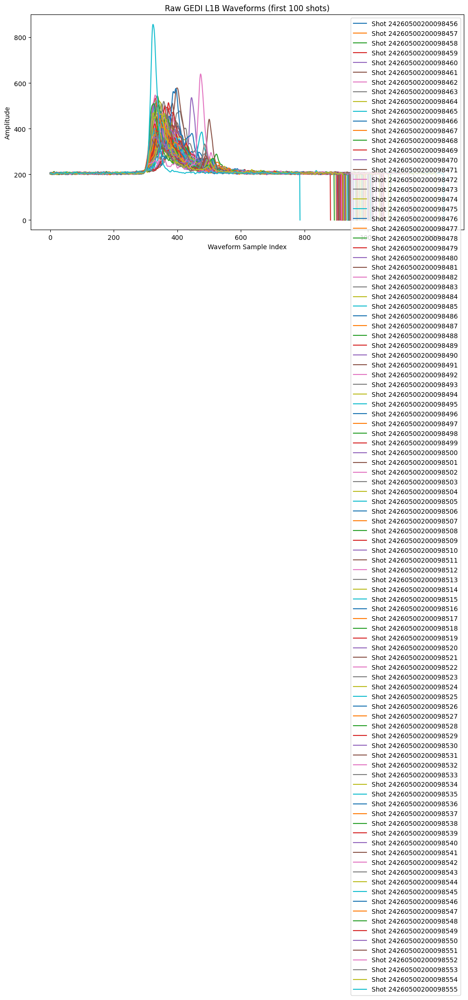

In [83]:
import h5py
import matplotlib.pyplot as plt

# Example: pick a single L1B file
h5_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011505_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5'

with h5py.File(h5_file, 'r') as f:
    beam = 'BEAM0101'
    rxwaveform = f[beam]['rxwaveform'][:]
    rx_sample_start_index = f[beam]['rx_sample_start_index'][:]
    rx_sample_count = f[beam]['rx_sample_count'][:]
    shot_numbers = f[beam]['shot_number'][:]

# Plot first N waveforms
N = 100
plt.figure(figsize=(12, 6))

for i in range(min(N, len(shot_numbers))):
    start = rx_sample_start_index[i]
    count = rx_sample_count[i]
    waveform = rxwaveform[start:start+count]
    plt.plot(waveform, label=f'Shot {shot_numbers[i]}')

plt.title(f'Raw GEDI L1B Waveforms (first {N} shots)')
plt.xlabel('Waveform Sample Index')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


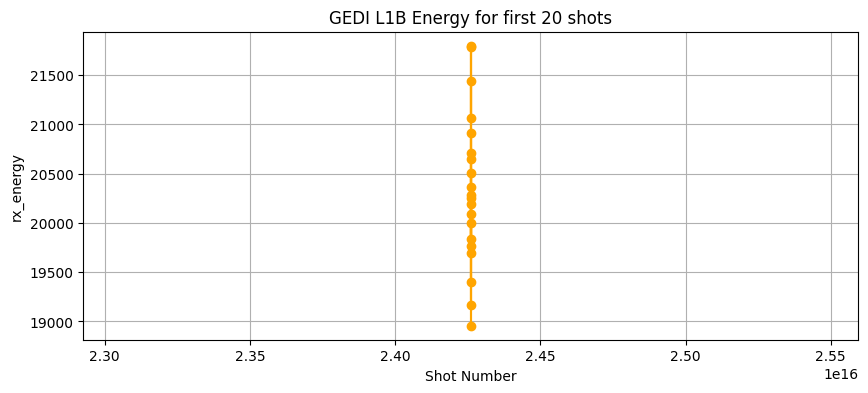

In [84]:
import h5py
import matplotlib.pyplot as plt

# Example L1B file
h5_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/119011505_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5'

with h5py.File(h5_file, 'r') as f:
    beam = 'BEAM0101'
    rx_energy = f[beam]['rx_energy'][:]          # energy per shot
    shot_numbers = f[beam]['shot_number'][:]

# Plot first N energy values
N = 20
plt.figure(figsize=(10, 4))
plt.plot(shot_numbers[:N], rx_energy[:N], marker='o', linestyle='-', color='orange')
plt.title(f'GEDI L1B Energy for first {N} shots')
plt.xlabel('Shot Number')
plt.ylabel('rx_energy')
plt.grid(True)
plt.show()


In [75]:
df.columns.tolist()

['beam',
 'source_file',
 'lat',
 'lon',
 'shot_number',
 'degrade',
 'stale_return_flag',
 'elevation_bin0',
 'rx_energy',
 'solar_elevation',
 'digital_elevation_model']

In [68]:
df

,beam,source_file,lat,lon,shot_number,degrade,stale_return_flag,elevation_bin0,rx_energy,solar_elevation,digital_elevation_model
0,119015652,119015652_GEDI01_B_2019337015939_O05514_03_T01...,35.235621,-85.920422,5.514050e+16,0.0,0.0,1582.835171,7245.43750,-53.278259,278.670898
1,119015652,119015652_GEDI01_B_2019337015939_O05514_03_T01...,35.235272,-85.919960,5.514050e+16,0.0,0.0,1581.423126,7383.62500,-53.278717,279.139374
2,119015652,119015652_GEDI01_B_2019337015939_O05514_03_T01...,35.234926,-85.919500,5.514050e+16,0.0,0.0,1586.159052,9100.93750,-53.279179,282.652222
3,119015652,119015652_GEDI01_B_2019337015939_O05514_03_T01...,35.234574,-85.919035,5.514050e+16,0.0,0.0,1578.363876,8437.75000,-53.279640,283.526825
4,119015652,119015652_GEDI01_B_2019337015939_O05514_03_T01...,35.234227,-85.918575,5.514050e+16,0.0,0.0,1580.225594,8350.12500,-53.280102,279.504791
...,...,...,...,...,...,...,...,...,...,...,...
6394,119032933,119032933_GEDI01_B_2024294160731_O33170_03_T08...,35.145647,-85.858979,3.317011e+17,0.0,0.0,619.756293,15584.37500,43.667702,556.715759
6395,119032933,119032933_GEDI01_B_2024294160731_O33170_03_T08...,35.145297,-85.858518,3.317011e+17,0.0,0.0,618.901499,15256.50000,43.668106,548.169678
6396,119032933,119032933_GEDI01_B_2024294160731_O33170_03_T08...,35.144948,-85.858061,3.317011e+17,0.0,0.0,611.594018,16436.75000,43.668510,548.169678
6397,119032933,119032933_GEDI01_B_2024294160731_O33170_03_T08...,35.144597,-85.857598,3.317011e+17,0.0,0.0,614.310209,15916.34375,43.668919,552.613403


In [ ]:
import pandas as pd
import numpy as np

# Load your merged filtered GEDI CSV
csv_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/GEDI_filtered_merged.csv'
df = pd.read_csv(csv_path)

# Replace strings or whitespace column names just in case
df.columns = df.columns.str.strip()

# Convert obvious fill values (-9999 etc.) to NaN
df.replace([-9999, -9999.0, -9998.999], np.nan, inplace=True)

# Select numeric columns only
numeric_df = df.select_dtypes(include=[np.number])

# Build summary table
summary = pd.DataFrame({
    'count': numeric_df.count(),
    'nans': numeric_df.isna().sum(),
    'mean': numeric_df.mean(),
    'min': numeric_df.min(),
    'max': numeric_df.max(),
    'std': numeric_df.std(),
})

# Add count of fill values (before conversion)
df_raw = pd.read_csv(csv_path)  # reload to count raw -9999 values
for col in numeric_df.columns:
    summary.loc[col, 'num_-9999'] = (df_raw[col] == -9999).sum() if col in df_raw.columns else 0

# Sort by number of missing values for easy QA
summary = summary.sort_values(by='nans', ascending=False)

# Display full table in Colab
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:.3f}'.format)
display(summary)

# Optional: Save to CSV
summary_path = csv_path.replace('.csv', '_summary.csv')
summary.to_csv(summary_path)
print(f"✅ Summary saved to: {summary_path}")


,count,nans,mean,min,max,std,num_-9999
rhog_error,0,1771,NaN,NaN,NaN,NaN,0.000
rhov_error,0,1771,NaN,NaN,NaN,NaN,0.000
mean,25,1746,167.281,-85.938,2691.800,553.670,0.000
std,25,1746,37.274,0.000,704.535,140.907,0.000
max,25,1746,278.129,-85.858,5229.000,1049.309,0.000
min,25,1746,43.893,-85.990,344.000,115.140,0.000
count,27,1744,807.407,0.000,872.000,232.720,0.000
nans,27,1744,64.593,0.000,872.000,232.720,0.000
num_-9999,27,1744,0.000,0.000,0.000,0.000,0.000
pai_z_bin_8,872,899,0.001,-0.000,0.184,0.009,0.000


✅ Summary saved to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/GEDI_filtered_merged_summary.csv


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D projection
import matplotlib.colors as mcolors

# Load the merged filtered GEDI CSV
csv_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/GEDI_filtered_merged.csv'
df = pd.read_csv(csv_path)

# Check that lat/lon exist
for col in ['lat', 'lon']:
    if col not in df.columns:
        raise ValueError(f"Column '{col}' is missing from the CSV!")

# Automatically select numeric variables excluding lat/lon
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
variables_to_plot = [v for v in numeric_cols if v not in ['lat', 'lon']]

print(f"Variables to plot in 3D: {variables_to_plot}")

# If 'AOI' exists, group by AOI; otherwise treat as one group
if 'AOI' in df.columns:
    grouped_dfs = {aoi: group for aoi, group in df.groupby('AOI')}
else:
    grouped_dfs = {'All_Data': df}

num_vars = len(variables_to_plot)
fig = plt.figure(figsize=(6 * num_vars, 6))  # Dynamic sizing

for i, var in enumerate(variables_to_plot, start=1):
    # Compute global min/max for color normalization
    vmin = min(g[var].min() for g in grouped_dfs.values())
    vmax = max(g[var].max() for g in grouped_dfs.values())

    ax = fig.add_subplot(1, num_vars, i, projection='3d')

    # Plot each group (AOI) with a different marker/color if multiple groups exist
    for name, gdf in grouped_dfs.items():
        ax.scatter(
            gdf['lat'], gdf['lon'], gdf[var],
            s=5,
            c=gdf[var],
            cmap='viridis',
            vmin=vmin,
            vmax=vmax,
            label=name
        )

    ax.set_xlabel('Latitude')
    ax.set_ylabel('Longitude')
    ax.set_zlabel(var)
    ax.set_title(f"{var} (3D)")
    ax.set_zlim(vmin, vmax)
    if len(grouped_dfs) > 1:
        ax.legend()

# Shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
norm = mcolors.Normalize(vmin=min(df[variables_to_plot].min()), vmax=max(df[variables_to_plot].max()))
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='viridis'), cax=cbar_ax)
cbar.set_label('Variable value')

plt.suptitle('3D Visualization of GEDI Variables (filtered)', fontsize=18)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


In [ ]:
# import pandas as pd
# import folium
# from folium.plugins import MarkerCluster
# from IPython.display import display

# # Load the filtered merged GEDI CSV
# csv_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/GEDI_filtered_merged.csv'
# df = pd.read_csv(csv_path)

# # Clean data
# df.replace([-9999, -9999.0], pd.NA, inplace=True)
# df = df.dropna(subset=['lat', 'lon'])

# # Choose variable to color points
# color_var = 'fhd_normal'  # Can be changed to pai, rh100, etc.
# df = df.dropna(subset=[color_var])

# # Normalize color values for colormap
# min_val, max_val = df[color_var].min(), df[color_var].max()
# df['color_norm'] = ((df[color_var] - min_val) / (max_val - min_val) * 255).astype(int)

# # Create map centered on the data
# m = folium.Map(location=[df['lat'].mean(), df['lon'].mean()], zoom_start=12, tiles='CartoDB positron')

# # Add marker cluster
# marker_cluster = MarkerCluster().add_to(m)

# # Add points
# import matplotlib.cm as cm
# import matplotlib.colors as colors

# cmap = cm.viridis
# norm = colors.Normalize(vmin=min_val, vmax=max_val)

# for _, row in df.iterrows():
#     color = colors.rgb2hex(cmap(norm(row[color_var])))
#     folium.CircleMarker(
#         location=[row['lat'], row['lon']],
#         radius=3,
#         color=color,
#         fill=True,
#         fill_opacity=0.7,
#         popup=f"{color_var}: {row[color_var]:.2f}<br>Beam: {row.get('beam', 'N/A')}"
#     ).add_to(marker_cluster)

# # Display map in Colab
# display(m)


In [89]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import MarkerCluster
from IPython.display import display
import matplotlib.cm as cm
import matplotlib.colors as colors
import os

# --- Helper to safely load .npy arrays and compute summaries ---
def load_npy_summary(path):
    if not isinstance(path, str) or not os.path.isfile(path):
        return np.nan, np.nan
    try:
        arr = np.load(path, allow_pickle=True)
        if len(arr) == 0:
            return np.nan, np.nan
        # If arr is a list of arrays (one per shot), flatten first element
        if isinstance(arr, list) or arr.ndim > 1:
            arr = arr[0]
        return np.nanmean(arr), np.nanmax(arr)
    except Exception:
        return np.nan, np.nan

# --- Load merged CSV ---
csv_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/GEDI_L1B_filtered_merged.csv'
df = pd.read_csv(csv_path)

# --- Compute waveform and energy summaries safely ---
df[['waveform_mean', 'waveform_max']] = df['rxwaveform_file'].apply(lambda x: pd.Series(load_npy_summary(x)))
df[['energy_mean', 'energy_max']] = df['rx_energy_file'].apply(lambda x: pd.Series(load_npy_summary(x)))

# --- Drop rows where lat/lon are NaN (map cannot plot those) ---
df = df.dropna(subset=['lat', 'lon'])

if df.empty:
    print("⚠️ No valid rows left to plot on the map.")
else:
    # --- Create map ---
    m = folium.Map(location=[df['lat'].mean(), df['lon'].mean()], zoom_start=12, tiles='CartoDB positron')
    marker_cluster = MarkerCluster().add_to(m)

    # Normalize colors by waveform max
    cmap = cm.viridis
    norm = colors.Normalize(vmin=df['waveform_max'].min(), vmax=df['waveform_max'].max())

    for _, row in df.iterrows():
        color = colors.rgb2hex(cmap(norm(row['waveform_max'])))
        popup_html = (
            f"Waveform mean: {row['waveform_mean']:.2f}<br>"
            f"Waveform max: {row['waveform_max']:.2f}<br>"
            f"Energy mean: {row['energy_mean']:.2f}<br>"
            f"Energy max: {row['energy_max']:.2f}<br>"
            f"Beam: {row.get('beam', 'N/A')}<br>"
            f"Shot: {row['shot_number']}"
        )
        folium.CircleMarker(
            location=[row['lat'], row['lon']],
            radius=3,
            color=color,
            fill=True,
            fill_opacity=0.7,
            popup=popup_html
        ).add_to(marker_cluster)

    display(m)


In [ ]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import MarkerCluster
from IPython.display import display
import matplotlib.pyplot as plt
import io
import base64
import os

# --- Load merged CSV ---
csv_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/GEDI_L1B_filtered_merged.csv'
df = pd.read_csv(csv_path)

# --- Keep only valid rows ---
df = df.dropna(subset=['lat', 'lon', 'rxwaveform_file'])

# --- Function to generate base64 image of waveform ---
def waveform_to_img_base64(npy_path, width=100, height=150):
    if not isinstance(npy_path, str) or not os.path.isfile(npy_path):
        return None
    try:
        arr_list = np.load(npy_path, allow_pickle=True)
        if len(arr_list) == 0:
            return None
        waveform = arr_list[0]  # waveform for first shot in file
        fig, ax = plt.subplots(figsize=(width/100, height/100))
        ax.plot(waveform, color='blue')
        ax.axis('off')  # remove axes for clean marker
        buf = io.BytesIO()
        plt.savefig(buf, format='png', bbox_inches='tight', transparent=True)
        plt.close(fig)
        buf.seek(0)
        img_base64 = base64.b64encode(buf.read()).decode('utf-8')
        return img_base64
    except Exception as e:
        return None

# --- Create map ---
m = folium.Map(location=[df['lat'].mean(), df['lon'].mean()], zoom_start=12, tiles='CartoDB positron')
marker_cluster = MarkerCluster().add_to(m)

# --- Add points with waveform image as popup ---
for _, row in df.iterrows():
    img_b64 = waveform_to_img_base64(row['rxwaveform_file'])
    if img_b64 is None:
        continue
    html_popup = f'<img src="data:image/png;base64,{img_b64}" width="150" height="200">'
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        color='blue',
        fill=True,
        fill_opacity=0.7,
        popup=folium.Popup(html_popup, max_width=200)
    ).add_to(marker_cluster)

display(m)


/tmp/ipython-input-3306392274.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(width/100, height/100))


/tmp/ipython-input-1428940091.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


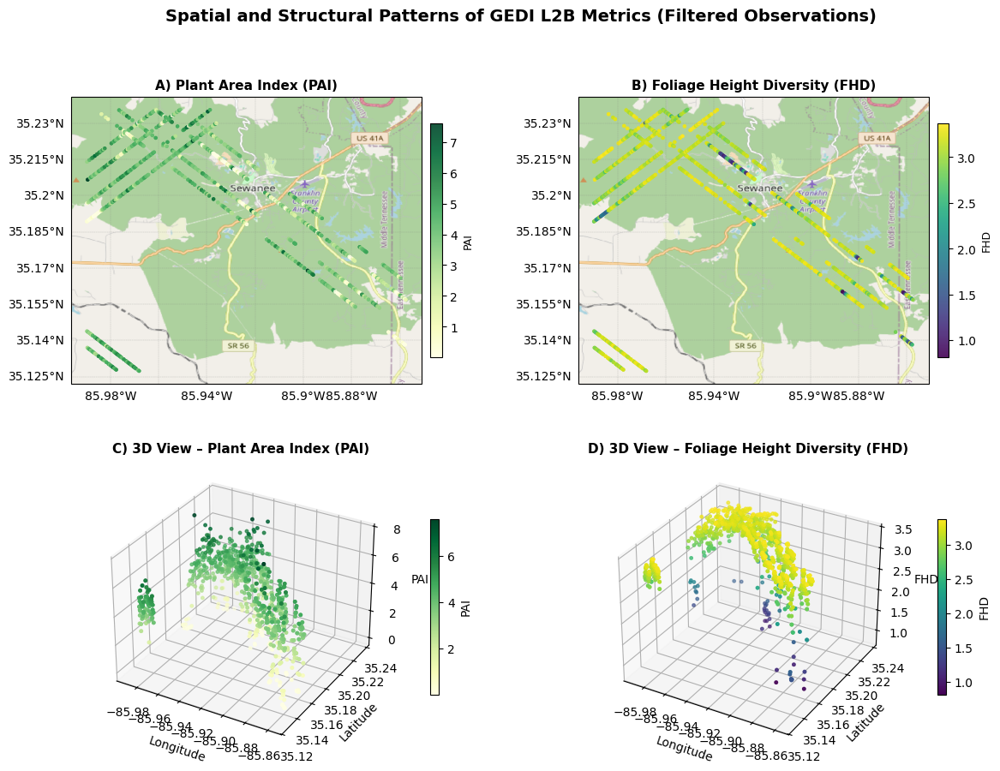

✅ Figure saved as 'GEDI_PAI_FHD_panels_OSM.tif' (600 DPI, publication-ready)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as mcolors

# === Load and Clean GEDI Data ===
csv_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/GEDI_filtered_merged.csv'
df = pd.read_csv(csv_path)

# Replace invalids and drop NaNs
df.replace([-9999, -9999.0], np.nan, inplace=True)
df = df.dropna(subset=['lat', 'lon', 'pai', 'fhd_normal', 'digital_elevation_model'])

# === Setup Figure ===
fig = plt.figure(figsize=(14, 10))
gs = fig.add_gridspec(2, 2, wspace=0.2, hspace=0.25)
proj = ccrs.PlateCarree()

# === Define Basemap (OpenStreetMap) ===
osm_tiles = cimgt.OSM()  # OpenStreetMap tiles

# --------------------------------------------------------------------
# PANEL A – PAI Map with OSM Basemap
# --------------------------------------------------------------------
ax1 = fig.add_subplot(gs[0, 0], projection=proj)
ax1.set_title('A) Plant Area Index (PAI)', fontsize=11, weight='bold')
ax1.add_image(osm_tiles, 12)  # Zoom level 12
sc1 = ax1.scatter(df['lon'], df['lat'], c=df['pai'], cmap='YlGn', s=10,
                  transform=proj, edgecolor='none', alpha=0.9)
# Remove top/right labels
gl1 = ax1.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5, linestyle='--')
gl1.top_labels = False
gl1.right_labels = False
cb1 = fig.colorbar(sc1, ax=ax1, orientation='vertical', shrink=0.8, pad=0.02)
cb1.set_label('PAI', fontsize=9)

# --------------------------------------------------------------------
# PANEL B – FHD Map with OSM Basemap
# --------------------------------------------------------------------
ax2 = fig.add_subplot(gs[0, 1], projection=proj)
ax2.set_title('B) Foliage Height Diversity (FHD)', fontsize=11, weight='bold')
ax2.add_image(osm_tiles, 12)
sc2 = ax2.scatter(df['lon'], df['lat'], c=df['fhd_normal'], cmap='viridis', s=10,
                  transform=proj, edgecolor='none', alpha=0.9)
gl2 = ax2.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5, linestyle='--')
gl2.top_labels = False
gl2.right_labels = False
cb2 = fig.colorbar(sc2, ax=ax2, orientation='vertical', shrink=0.8, pad=0.02)
cb2.set_label('FHD', fontsize=9)

# --------------------------------------------------------------------
# PANEL C – PAI 3D Scatter
# --------------------------------------------------------------------
ax3 = fig.add_subplot(gs[1, 0], projection='3d')
sc3 = ax3.scatter(df['lon'], df['lat'], df['pai'], c=df['pai'], cmap='YlGn', s=6)
ax3.set_title('C) 3D View – Plant Area Index (PAI)', fontsize=11, weight='bold')
ax3.set_xlabel('Longitude')
ax3.set_ylabel('Latitude')
ax3.set_zlabel('PAI')
cbar3 = plt.colorbar(sc3, ax=ax3, shrink=0.6, pad=0.1)
cbar3.set_label('PAI')

# --------------------------------------------------------------------
# PANEL D – FHD 3D Scatter
# --------------------------------------------------------------------
ax4 = fig.add_subplot(gs[1, 1], projection='3d')
sc4 = ax4.scatter(df['lon'], df['lat'], df['fhd_normal'], c=df['fhd_normal'], cmap='viridis', s=6)
ax4.set_title('D) 3D View – Foliage Height Diversity (FHD)', fontsize=11, weight='bold')
ax4.set_xlabel('Longitude')
ax4.set_ylabel('Latitude')
ax4.set_zlabel('FHD')
cbar4 = plt.colorbar(sc4, ax=ax4, shrink=0.6, pad=0.1)
cbar4.set_label('FHD')

# === Final Formatting ===
plt.suptitle('Spatial and Structural Patterns of GEDI L2B Metrics (Filtered Observations)', fontsize=14, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# === Save High-Resolution Output ===
plt.savefig('/content/GEDI_PAI_FHD_panels_OSM.png', dpi=600, bbox_inches='tight')
plt.show()

print("✅ Figure saved as 'GEDI_PAI_FHD_panels_OSM.tif' (600 DPI, publication-ready)")


In [ ]:
import h5py
import os
import numpy as np

data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
beam_groups = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

# Count raw observations
raw_counts = 0
for root, _, files in os.walk(data_dir):
    for file in files:
        if file.endswith('.h5'):
            with h5py.File(os.path.join(root, file), 'r') as f:
                for beam in beam_groups:
                    if beam in f:
                        # Use lat_lowestmode as a proxy for number of shots
                        raw_counts += len(f[beam]['geolocation/lat_lowestmode'][:])

print(f"Total raw GEDI observations across all beams: {raw_counts}")


Total raw GEDI observations across all beams: 15914


In [ ]:
import pandas as pd

csv_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/filtered_csvs/GEDI_filtered_merged.csv'
df_filtered = pd.read_csv(csv_path)

print(f"Total filtered GEDI observations: {len(df_filtered)}")


Total filtered GEDI observations: 1771
